In [9]:
from typing import Optional, TypeVar, Callable, Optional
import os
import pickle
import warnings
import pandas as pd
from qlib.backtest import backtest, executor as exec
from qlib.contrib.evaluate import risk_analysis
from qlib.contrib.report.analysis_position import report_graph
from alphagen.data.expression import *
import numpy as np
from alphagen_qlib.stock_data import CryptoDataLP
from alphagen_generic.features import *
from alphagen_qlib.strategy import TopKSwapNStrategy
from datetime import datetime
import joblib
from qlib.data.dataset.processor import ZScoreNorm, Fillna, DropnaProcessor, MinMaxNorm, CSZFillna
from qlib.contrib.strategy import TopkDropoutStrategy
_T = TypeVar("_T")


def _create_parents(path: str) -> None:
    dir = os.path.dirname(path)
    if dir != "":
        os.makedirs(dir, exist_ok=True)


def write_all_text(path: str, text: str) -> None:
    _create_parents(path)
    with open(path, "w") as f:
        f.write(text)


def dump_pickle(path: str,
                factory: Callable[[], _T],
                invalidate_cache: bool = False) -> Optional[_T]:
    if invalidate_cache or not os.path.exists(path):
        _create_parents(path)
        obj = factory()
        with open(path, "wb") as f:
            pickle.dump(obj, f)
        return obj


class BacktestResult(dict):
    sharpe: float
    annual_return: float
    max_drawdown: float
    information_ratio: float
    annual_excess_return: float
    excess_max_drawdown: float

class QlibBacktest:
    def __init__(
        self,
        benchmark: str = "SH000300",
        top_k: int = 50,
        n_drop: Optional[int] = 5,
        deal: str = "open",
        open_cost: float = 0.0015,
        close_cost: float = 0.0015,
        min_cost: float = 5,
        freq: str = "day"
    ):
        self._benchmark = benchmark
        self._top_k = top_k
        self._n_drop = n_drop if n_drop is not None else top_k
        self._deal_price = deal
        self._open_cost = open_cost
        self._close_cost = close_cost
        self._min_cost = min_cost
        self._freq = freq

    def run(
        self,
        prediction: pd.Series,
        output_prefix: Optional[str] = None,
        return_report: bool = False
    ) -> BacktestResult:
        prediction = prediction.sort_index()
        print(f"============================= \n{prediction}")
        index: pd.MultiIndex = prediction.index.remove_unused_levels()  # type: ignore
        dates = index.levels[0]

        def backtest_impl(last: int = -1):
            with warnings.catch_warnings():
                warnings.simplefilter("ignore")
                STRATEGY_CONFIG = {
                    "topk": self._top_k,
                    "n_drop": self._n_drop,
                    "signal": prediction,
                    "only_tradable": True,
                    "hold_thresh": 20
                }

                EXECUTOR_CONFIG = {
                    "time_per_step": "month",
                    "generate_portfolio_metrics": True,
                    "verbose": True, 
                }
                backtest_config = {
                    "start_time": dates[0],
                    "end_time": dates[last],
                    "account": 100000000,
                    "benchmark": self._benchmark,
                    "exchange_kwargs": {
                        "freq": "day",
                        "limit_threshold": 0.095,
                        "deal_price": self._deal_price,
                        "open_cost": self._open_cost,
                        "close_cost": self._close_cost,
                        "min_cost": 5,
                    },
                }

                strategy = TopkDropoutStrategy(**STRATEGY_CONFIG)
                executor = exec.SimulatorExecutor(**EXECUTOR_CONFIG)
                return backtest(
                        executor=executor,
                        strategy=strategy,
                        **backtest_config
                )[0]

        try:
            portfolio_metric = backtest_impl()
        except IndexError:
            print("Cannot backtest till the last day, trying again with one less day")
            portfolio_metric = backtest_impl(-2)

#         report, _ = portfolio_metric["1day"]    # type: ignore
        report, _ = portfolio_metric["1month"]
        result: dict = self._analyze_report(report)
#         graph = report_graph(report, show_notebook=False)[0]
        report_graph(report, show_notebook=True)
        print(report)
        print(result)
        if output_prefix is not None:
            dump_pickle(output_prefix + "-report.pkl", lambda: report, True)
#             dump_pickle(output_prefix + "-graph.pkl", lambda: graph, True)
            write_all_text(output_prefix + "-result.json", str(result))

        print(report)
        print(result)
        return report if return_report else result

    def _analyze_report(self, report: pd.DataFrame) -> BacktestResult:
        excess = risk_analysis(report["return"] - report["bench"] - report["cost"])["risk"]
        returns = risk_analysis(report["return"] - report["cost"])["risk"]

        def loc(series: pd.Series, field: str) -> float:
            return series.loc[field]    # type: ignore

        return BacktestResult(
            sharpe=loc(returns, "information_ratio"),
            annual_return=loc(returns, "annualized_return"),
            max_drawdown=loc(returns, "max_drawdown"),
            information_ratio=loc(excess, "information_ratio"),
            annual_excess_return=loc(excess, "annualized_return"),
            excess_max_drawdown=loc(excess, "max_drawdown"),
        )
    
EXPR_MAP = {
    "$high": "high",
    "$low": "low",
    "$volume": "volume",
    "$open": "open_",
    "$close": "close",
    "$quote_volume": "quote_volume",
    "$trade_num": "trade_num",
    "$taker_buy_base_asset_volume": "taker_buy_base_asset_volume",
    "$taker_buy_quote_asset_volume": "taker_buy_quote_asset_volume",
    "$circulating_supply": "circulating_supply",
    "$circulating_mcap": "circulating_mcap",
    "$num_market_pairs": "num_market_pairs",
    "$pct_diff_abs": "pct_diff_abs",
    "$total_mcap": "total_mcap",
    "$turnover_rate": "turnover_rate",
    "$usd_price": "usd_price",
    "$usd_price_pct": "usd_price_pct",
    "$usd_volume": "usd_volume",
}    

def load_alpha_exprs(file_path):

    import json
    import copy
    with open(file_path, "r") as f:
        rslt = json.load(f)
        exprs = rslt.pop("exprs")
        _exprs = []
        for expr in exprs:
            e = copy.deepcopy(expr)
            for k, v in EXPR_MAP.items():
                e = e.replace(k, v)
            _exprs.append(eval(e))
        rslt["exprs"] = _exprs
        return rslt
    
def make_data_by_exprs(data, rslt):
    exprs = rslt["exprs"]
    weights = rslt["weights"]
    target = Ref(close, -20) / close - 1
    dfs = []
    for expr in exprs:
        e = expr.evaluate(data)
        _data_df = data.make_dataframe(e)
        # 替换 inf/-inf 为 NaN
        _data_df.replace([np.inf, -np.inf], np.nan, inplace=True)
        # 替换所有的 NaN 值为 0
        _data_df.fillna(0, inplace=True)
        dfs.append(_data_df)
    
    print(f"exprs num: {len(exprs)}, exprs: {exprs}")
    data_df = pd.concat(dfs, axis=1)
    idx_list = [_ for _ in range(len(exprs))]
    data_df.columns = idx_list
    weighted_sum = data_df.mul(weights).sum(axis=1)
    data_df['Weighted_Sum'] = weighted_sum
    return data_df
    
def run(data, file_path, save_path):
    qlib_backtest = QlibBacktest(
        benchmark="eth-usdt",
        top_k=50,
        n_drop=50,
        deal="close",
        open_cost=0.0015,
        close_cost=0.0015,
        min_cost=5,
    )

    rslt = load_alpha_exprs(file_path)
    data_df = make_data_by_exprs(data, rslt)

    qlib_backtest.run(data_df['Weighted_Sum'], save_path)


In [2]:
features = list(FeatureType)
features

[<FeatureType.OPEN: 0>,
 <FeatureType.CLOSE: 1>,
 <FeatureType.HIGH: 2>,
 <FeatureType.LOW: 3>,
 <FeatureType.VOLUME: 4>,
 <FeatureType.QUOTE_VOLUME: 5>,
 <FeatureType.TRADE_NUM: 6>,
 <FeatureType.TAKER_BUY_BASE_ASSET_VOLUME: 7>,
 <FeatureType.TAKER_BUY_QUOTE_ASSET_VOLUME: 8>,
 <FeatureType.CIRCULATING_SUPPLY: 9>,
 <FeatureType.CIRCULATING_MCAP: 10>,
 <FeatureType.NUM_MARKET_PAIRS: 11>,
 <FeatureType.PCT_DIFF_ABS: 12>,
 <FeatureType.TOTAL_MCAP: 13>,
 <FeatureType.TURNOVER_RATE: 14>,
 <FeatureType.USD_PRICE: 15>,
 <FeatureType.USD_PRICE_PCT: 16>,
 <FeatureType.USD_VOLUME: 17>]

In [4]:
data = CryptoDataLP(instrument="all",
                    start_time='2021-01-01',
                    end_time='2021-12-30',
                    device=torch.device("cpu"),
                    processors=[])
features = ['$' + f.name.lower() for f in data._features]
print(f"instruments: {data._instrument}")
df = data._load_exprs(features)
df

instruments: all


$open     $close      $high       $low  \
datetime   instrument                                                 
2020-09-23 ADA-USDT       0.081480   0.076630   0.082800   0.075450   
           ADADOWN-USDT  14.324000  16.493999  16.860001  13.802000   
           ADAUP-USDT     2.422000   2.060000   2.488000   1.995000   
           AION-USDT      0.083500   0.074600   0.084000   0.074500   
           ALGO-USDT      0.306300   0.269000   0.310000   0.263000   
...                            ...        ...        ...        ...   
2022-01-29 YGG-USDT       2.954000   3.058000   3.182000   2.814000   
           ZEC-USDT      91.199997  96.300003  97.099998  90.599998   
           ZEN-USDT      38.939999  41.549999  43.860001  38.779999   
           ZIL-USDT       0.045270   0.045690   0.046370   0.044740   
           ZRX-USDT       0.544200   0.565500   0.571500   0.541900   

                              $volume  $quote_volume  $trade_num  \
datetime   instrument                                              
2020-09-23 ADA-USDT      2.887886e+08   2.296553e+07     51320.0   
           ADADOWN-USDT  1.398114e+04   2.114993e+05      1272.0   
           ADAUP-USDT    1.390265e+05   3.119338e+05      2163.0   
           AION-USDT     2.211855e+06   1.734172e+05      1651.0   
           ALGO-USDT     1.812498e+07   5.239142e+06     22308.0   
...                               ...            ...         ...   
2022-01-29 YGG-USDT      3.119476e+06   9.183646e+06     51746.0   
           ZEC-USDT      1.697799e+05   1.605301e+07     48026.0   
           ZEN-USDT      6.142556e+05   2.573780e+07     69947.0   
           ZIL-USDT      1.067285e+08   4.863029e+06     23973.0   
           ZRX-USDT      2.754486e+06   1.536990e+06      8280.0   

                         $taker_buy_base_asset_volume  \
datetime   instrument                                   
2020-09-23 ADA-USDT                      1.460489e+08   
           ADADOWN-USDT                  7.451150e+03   
           ADAUP-USDT                    5.691269e+04   
           AION-USDT                     6.801258e+05   
           ALGO-USDT                     8.776372e+06   
...                                               ...   
2022-01-29 YGG-USDT                      1.453102e+06   
           ZEC-USDT                      8.878025e+04   
           ZEN-USDT                      3.035376e+05   
           ZIL-USDT                      5.599957e+07   
           ZRX-USDT                      1.351765e+06   

                         $taker_buy_quote_asset_volume  $circulating_supply  \
datetime   instrument                                                         
2020-09-23 ADA-USDT                       1.161950e+07         3.111248e+10   
           ADADOWN-USDT                   1.133255e+05                  NaN   
           ADAUP-USDT                     1.291150e+05                  NaN   
           AION-USDT                      5.373425e+04         4.682256e+08   
           ALGO-USDT                      2.541818e+06         1.091510e+09   
...                                                ...                  ...   
2022-01-29 YGG-USDT                       4.286100e+06         8.528569e+07   
           ZEC-USDT                       8.392908e+06         1.364616e+07   
           ZEN-USDT                       1.271712e+07         1.201668e+07   
           ZIL-USDT                       2.551203e+06         1.233970e+10   
           ZRX-USDT                       7.547286e+05         8.474961e+08   

                         $circulating_mcap  $cmc_rank  $num_market_pairs  \
datetime   instrument                                                      
2020-09-23 ADA-USDT           3.013095e+09       11.0              198.0   
           ADADOWN-USDT                NaN     2405.0                1.0   
           ADAUP-USDT                  NaN     2363.0                1.0   
           AION-USDT          3.775302e+07      173.0               25

In [44]:
from qlib.data import D
instruments = D.instruments(market="mp10")
all_components = D.list_instruments(instruments, start_time="2021-01-01", end_time="2023-12-31", as_list=True,
                                        freq="day")
all_components

['BTC-USDT',
 'DASH-USDT',
 'DCR-USDT',
 'DOGE-USDT',
 'ETC-USDT',
 'ETH-USDT',
 'LTC-USDT',
 'SOL-USDT',
 'XEM-USDT',
 'XMR-USDT',
 'ZEC-USDT']

## olhc-原始数据

In [7]:
""" all """
code = "all"

prefix = "/Users/yangguangyu/Projects/QuantLearning/research/test_result/alphagen/crypto/new_all_200_5_20240113222950/"
file_path = prefix + "30720_steps_pool.json" 
minmax_proc = joblib.load("/Users/yangguangyu/Projects/QuantLearning/research/alphagen/logs/new_all_200_5_20240113222950_minmax.pkl")
dropna_proc = DropnaProcessor()
csfillna_proc = CSZFillna()
infer_processors = [csfillna_proc, minmax_proc]
data = CryptoDataLP(instrument=code,
                    start_time='2022-01-01',
                    end_time='2023-06-30',
                    device=torch.device("cpu"),
                    processors=infer_processors)

timestamp = datetime.now().strftime('%Y%m%d%H%M%S')
run(data, file_path, f"{prefix}/{code}_{timestamp}")

instruments: all
raw df:                                 $open      $close       $high        $low  \
datetime   instrument                                                       
2021-09-23 1INCH-USDT        2.630000    2.778000    2.900000    2.557000   
           1INCHDOWN-USDT    0.072820    0.062470    0.077470    0.058490   
           1INCHUP-USDT      0.033315    0.036864    0.038600    0.031588   
           AAVE-USDT       301.799988  308.899994  309.700012  294.000000   
           AAVEDOWN-USDT     0.010331    0.009636    0.011022    0.009579   
...                               ...         ...         ...         ...   
2023-07-30 YGG-USDT          0.177100    0.174100    0.178100    0.168200   
           ZEC-USDT         30.379999   29.900000   30.440001   28.790001   
           ZEN-USDT          9.280000    9.140000    9.480000    8.850000   
           ZIL-USDT          0.021520    0.020940    0.021550    0.020430   
           ZRX-USDT          0.220500    0.216300  

[44924:MainThread](2024-01-14 20:27:12,550) INFO - qlib.timer - [log.py:127] - Time cost: 0.608s | CSZFillna Done
[44924:MainThread](2024-01-14 20:27:12,555) INFO - qlib.timer - [log.py:127] - Time cost: 0.004s | MinMaxNorm Done


preprocessed df:                                   $open        $close         $high  \
datetime   instrument                                                 
2021-09-23 1INCH-USDT      3.173435e-05  3.351625e-05  3.052629e-05   
           1INCHDOWN-USDT  8.786450e-07  7.536711e-07  8.154499e-07   
           1INCHUP-USDT    4.019658e-07  4.447375e-07  4.062920e-07   
           AAVE-USDT       3.641610e-03  3.726845e-03  3.260000e-03   
           AAVEDOWN-USDT   1.246339e-07  1.162346e-07  1.159973e-07   
...                                 ...           ...           ...   
2023-07-30 YGG-USDT        2.136919e-06  2.100475e-06  1.874713e-06   
           ZEC-USDT        3.665742e-04  3.607403e-04  3.204210e-04   
           ZEN-USDT        1.119752e-04  1.102731e-04  9.978945e-05   
           ZIL-USDT        2.596438e-07  2.526162e-07  2.268183e-07   
           ZRX-USDT        2.660596e-06  2.609613e-06  2.353660e-06   

                                   $low       $volume  $quo

exprs num: 200, exprs: [Med(Mul(Add(Constant(-5.0),Add($volume,Constant(-2.0))),Constant(-10.0)),30), Mul(Constant(-30.0),Med(Var($open,30),10)), Log($volume), Log(Std(Med(Mul(Mul(Constant(0.5),$taker_buy_quote_asset_volume),Constant(5.0)),30),40)), Corr(Add($taker_buy_quote_asset_volume,Constant(-2.0)),Mul(Constant(1.0),$trade_num),50), Less(Abs($taker_buy_quote_asset_volume),$volume), Add(Constant(-5.0),Delta(Std($high,30),50)), Div(Add(Div($taker_buy_quote_asset_volume,$high),Log(Div(Med($taker_buy_quote_asset_volume,30),$low))),$high), Div(Log(Min(Mul(Constant(10.0),$low),30)),Constant(0.01)), Sub(Add(Constant(-10.0),Min($volume,50)),Cov($taker_buy_quote_asset_volume,$close,10)), Max(Div(Constant(5.0),Div($close,Less($high,Constant(-0.5)))),30), Max($volume,30), Max(Log(Ref(Div(Med($volume,10),Greater(Constant(-0.01),$volume)),30)),30), EMA(Div(Med(Delta(Add(Constant(0.01),$taker_buy_base_asset_volume),20),10),$open),20), Mul(Add(Add(Div($taker_buy_base_asset_volume,$quote_volume),

/var/folders/xj/8b3m4m7n4xsgjxqhl9c106k40000gn/T/ipykernel_44924/3485668924.py:208: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

[44924:MainThread](2024-01-14 20:27:18,281) WARNING - qlib.BaseExecutor - [executor.py:121] - `common_infra` is not set for <qlib.backtest.executor.SimulatorExecutor object at 0x2b03f8820>
[44924:MainThread](2024-01-14 20:27:18,284) INFO - qlib.backtest caller - [__init__.py:93] - Create new exchange


datetime    instrument    
2022-01-01  1INCH-USDT        9.654278e+07
            1INCHDOWN-USDT   -6.301004e+00
            1INCHUP-USDT     -7.133930e+00
            AAVE-USDT        -8.953425e+07
            AAVEDOWN-USDT     0.000000e+00
                                  ...     
2023-06-30  YGG-USDT          2.007089e+10
            ZEC-USDT         -3.130851e+08
            ZEN-USDT         -3.731984e+09
            ZIL-USDT          1.888010e+11
            ZRX-USDT          1.622928e+10
Name: Weighted_Sum, Length: 233688, dtype: float64


[44924:MainThread](2024-01-14 20:27:24,325) WARNING - qlib.online operator - [exchange.py:219] - $close field data contains nan.
[44924:MainThread](2024-01-14 20:27:24,326) WARNING - qlib.online operator - [exchange.py:219] - $close field data contains nan.
[44924:MainThread](2024-01-14 20:27:24,327) WARNING - qlib.online operator - [exchange.py:226] - factor.day.bin file not exists or factor contains `nan`. Order using adjusted_price.
[44924:MainThread](2024-01-14 20:27:24,327) WARNING - qlib.online operator - [exchange.py:228] - trade unit 100 is not supported in adjusted_price mode.
backtest loop:  83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 15/18 [00:00<00:00, 69.59it/s]

[I 2022-02-01 00:00:00]: buy SHIB-USDT, price 0.00, amount 73671968165.44157, deal_amount 73671968165.44157, factor None, value 1900000.00, cash 98097150.00.
[I 2022-02-01 00:00:00]: buy XEC-USDT, price 0.00, amount 24145381162.71266, deal_amount 24145381162.71266, factor None, value 1900000.00, cash 96194300.00.
[I 2022-02-01 00:00:00]: buy XRPDOWN-USDT, price 0.00, amount 3256212403.1493387, deal_amount 3256212403.1493387, factor None, value 1900000.00, cash 94291450.00.
[I 2022-02-01 00:00:00]: buy BTTC-USDT, price 0.00, amount 954773821030.1444, deal_amount 954773821030.1444, factor None, value 1900000.00, cash 92388600.00.
[I 2022-02-01 00:00:00]: buy USDP-USDT, price 1.00, amount 1900760.3169970135, deal_amount 1900760.3169970135, factor None, value 1900000.00, cash 90485750.00.
[I 2022-02-01 00:00:00]: buy WIN-USDT, price 0.00, amount 6797853220.190415, deal_amount 6797853220.190415, factor None, value 1900000.00, cash 88582900.00.
[I 2022-02-01 00:00:00]: buy USDC-USDT, price 1

backtest loop: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 69.29it/s]

[I 2023-04-01 00:00:00]: buy LUNC-USDT, price 0.00, amount 2506.9348867892327, deal_amount 0, factor None, value 0.00, cash 0.87.
[I 2023-04-01 00:00:00]: buy LEVER-USDT, price 0.00, amount 142.39753773316858, deal_amount 0, factor None, value 0.00, cash 0.87.
[I 2023-04-01 00:00:00]: buy LINKUP-USDT, price 0.01, amount 45.1784283387894, deal_amount 0, factor None, value 0.00, cash 0.87.
[I 2023-05-01 00:00:00]: buy LUNC-USDT, price 0.00, amount 1624.392913658525, deal_amount 0, factor None, value 0.00, cash 0.87.
[I 2023-05-01 00:00:00]: buy LEVER-USDT, price 0.00, amount 93.23993402175645, deal_amount 0, factor None, value 0.00, cash 0.87.
[I 2023-05-01 00:00:00]: buy VIDT-USDT, price 0.03, amount 4.646225573178483, deal_amount 0, factor None, value 0.00, cash 0.87.
[I 2023-05-01 00:00:00]: buy PEOPLE-USDT, price 0.02, amount 7.980385383428659, deal_amount 0, factor None, value 0.00, cash 0.87.
[I 2023-05-01 00:00:00]: buy REI-USDT, price 0.03, amount 5.23010007700878, deal_amount 0,

                 account    return  total_turnover      turnover  \
datetime                                                           
2022-01-01  1.000000e+08  0.000000    0.000000e+00  0.000000e+00   
2022-02-01  9.985750e+07  0.000000    9.500000e+07  9.500000e-01   
2022-03-01  1.241724e+08  0.243566    9.961462e+07  4.621210e-02   
2022-04-01  9.159414e+07 -0.262361    9.983878e+07  1.805195e-03   
2022-05-01  7.149295e+07 -0.219459    9.984967e+07  1.188760e-04   
2022-06-01  6.391625e+07 -0.105978    9.985016e+07  6.884140e-06   
2022-07-01  6.628587e+07  0.037074    9.985017e+07  7.879254e-08   
2022-08-01  6.289773e+07 -0.051114    9.985017e+07  0.000000e+00   
2022-09-01  5.776606e+07 -0.081587    9.985017e+07  0.000000e+00   
2022-10-01  5.587575e+07 -0.032724    9.985017e+07  0.000000e+00   
2022-11-01  5.175493e+07 -0.073750    9.985017e+07  0.000000e+00   
2022-12-01  4.915995e+07 -0.050140    9.985017e+07  0.000000e+00   
2023-01-01  4.910700e+07 -0.001077    9.985017e+

## XGBoost

In [4]:
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV

""" all """
code = "all"

prefix = "/Users/yangguangyu/Projects/QuantLearning/research/test_result/alphagen/crypto/new_all_200_5_20240120000808/"
file_path = prefix + "24576_steps_pool.json"

minmax_proc = joblib.load("/Users/yangguangyu/Projects/QuantLearning/research/alphagen/new_all_200_5_20240119092204_minmax.pkl")
dropna_proc = DropnaProcessor()
csfillna_proc = CSZFillna()
infer_processors = [csfillna_proc, dropna_proc, minmax_proc]
timestamp = datetime.now().strftime('%Y%m%d%H%M%S')

train_data = CryptoDataLP(instrument=code,
                    start_time='2020-01-01',
                    end_time='2021-12-31',
                    device=torch.device("cpu"),
                    processors=infer_processors)

test_data = CryptoDataLP(instrument=code,
                    start_time='2022-01-01',
                    end_time='2023-06-30',
                    device=torch.device("cpu"),
                    processors=infer_processors)


[36905:MainThread](2024-01-19 22:27:26,417) INFO - qlib.Initialization - [config.py:416] - default_conf: client.
[36905:MainThread](2024-01-19 22:27:26,604) INFO - qlib.Initialization - [__init__.py:74] - qlib successfully initialized based on client settings.
[36905:MainThread](2024-01-19 22:27:26,605) INFO - qlib.Initialization - [__init__.py:76] - data_path={'__DEFAULT_FREQ': PosixPath('/Users/yangguangyu/.qlib/qlib_data/crypto_data_1d')}


instruments: all
raw df:                            $open     $close      $high       $low  \
datetime   instrument                                               
2019-09-23 ADA-USDT     0.052510   0.051790   0.053360   0.051070   
           ALGO-USDT    0.320000   0.315000   0.325000   0.314000   
           ANKR-USDT    0.003037   0.002986   0.003043   0.002975   
           ATOM-USDT    3.190000   3.065000   3.294000   3.015000   
           BAND-USDT    0.680000   0.811000   0.848000   0.677800   
...                          ...        ...        ...        ...   
2022-01-30 YGG-USDT     2.738000   2.951000   3.000000   2.729000   
           ZEC-USDT    88.800003  91.199997  91.800003  86.199997   
           ZEN-USDT    36.759998  38.950001  39.790001  36.119999   
           ZIL-USDT     0.044060   0.045290   0.045560   0.042900   
           ZRX-USDT     0.530100   0.544300   0.548300   0.508600   

                            $volume  $quote_volume  $trade_num  \
datetime   

[36905:MainThread](2024-01-19 22:27:32,867) INFO - qlib.timer - [log.py:127] - Time cost: 0.699s | CSZFillna Done
[36905:MainThread](2024-01-19 22:27:32,872) INFO - qlib.timer - [log.py:127] - Time cost: 0.004s | DropnaProcessor Done
[36905:MainThread](2024-01-19 22:27:32,874) INFO - qlib.timer - [log.py:127] - Time cost: 0.002s | MinMaxNorm Done


preprocessed df:                               $open        $close         $high          $low  \
datetime   instrument                                                           
2019-09-23 ADA-USDT    6.335785e-07  6.248180e-07  5.616604e-07  7.711613e-07   
           ALGO-USDT   3.861193e-06  3.800418e-06  3.421029e-06  4.741571e-06   
           ANKR-USDT   3.662231e-08  3.600308e-08  3.200779e-08  4.489644e-08   
           ATOM-USDT   3.849148e-05  3.697887e-05  3.467366e-05  4.552837e-05   
           BAND-USDT   8.205062e-06  9.784604e-06  8.926292e-06  1.023518e-05   
...                             ...           ...           ...           ...   
2022-01-30 YGG-USDT    3.303751e-05  3.560347e-05  3.157893e-05  4.120959e-05   
           ZEC-USDT    1.071488e-03  1.100318e-03  9.663158e-04  1.301674e-03   
           ZEN-USDT    4.435572e-04  4.699276e-04  4.188421e-04  5.454348e-04   
           ZIL-USDT    5.316182e-07  5.463963e-07  4.795551e-07  6.477891e-07   
           

raw df:                                 $open      $close       $high        $low  \
datetime   instrument                                                       
2021-09-23 1INCH-USDT        2.575000    2.321000    2.665000    2.240000   
           1INCHDOWN-USDT    0.089690    0.107390    0.113010    0.083000   
           1INCHUP-USDT      0.032450    0.025517    0.034858    0.023572   
           AAVE-USDT       291.899994  271.700012  306.899994  259.899994   
           AAVEDOWN-USDT     0.011910    0.013948    0.015162    0.010459   
...                               ...         ...         ...         ...   
2023-07-30 YGG-USDT          0.197800    0.181700    0.225000    0.177800   
           ZEC-USDT         30.070000   30.650000   30.850000   30.000000   
           ZEN-USDT          9.730000    9.540000   10.300000    9.510000   
           ZIL-USDT          0.020730    0.020990    0.021040    0.020470   
           ZRX-USDT          0.208100    0.214000    0.215500    0.2

[36905:MainThread](2024-01-19 22:27:39,315) INFO - qlib.timer - [log.py:127] - Time cost: 0.579s | CSZFillna Done
[36905:MainThread](2024-01-19 22:27:39,324) INFO - qlib.timer - [log.py:127] - Time cost: 0.008s | DropnaProcessor Done
[36905:MainThread](2024-01-19 22:27:39,328) INFO - qlib.timer - [log.py:127] - Time cost: 0.004s | MinMaxNorm Done


preprocessed df:                                   $open        $close         $high  \
datetime   instrument                                                 
2021-09-23 1INCH-USDT      3.107070e-05  2.800259e-05  2.805261e-05   
           1INCHDOWN-USDT  1.082204e-06  1.295626e-06  1.189555e-06   
           1INCHUP-USDT    3.915284e-07  3.078372e-07  3.669025e-07   
           AAVE-USDT       3.522153e-03  3.278031e-03  3.230526e-03   
           AAVEDOWN-USDT   1.436866e-07  1.682584e-07  1.595762e-07   
...                                 ...           ...           ...   
2023-07-30 YGG-USDT        2.386691e-06  2.192168e-06  2.368397e-06   
           ZEC-USDT        3.628336e-04  3.697889e-04  3.247368e-04   
           ZEN-USDT        1.174051e-04  1.150991e-04  1.084210e-04   
           ZIL-USDT        2.501114e-07  2.532194e-07  2.214499e-07   
           ZRX-USDT        2.510974e-06  2.581864e-06  2.268397e-06   

                                   $low       $volume  $quo

In [5]:
scaler = StandardScaler()
target = Ref(close, -20) / close - 1
rslt = load_alpha_exprs(file_path)

# y_train
e = target.evaluate(train_data)
y_train = train_data.make_dataframe(e)
y_train.replace([np.inf, -np.inf], np.nan, inplace=True)
y_train.fillna(0, inplace=True)

# X_train
train_set = make_data_by_exprs(train_data, rslt)
X_raw = train_set.drop("Weighted_Sum", axis=1)
train_std = scaler.fit_transform(X_raw)
X_train = pd.DataFrame(train_std, index=X_raw.index, columns=X_raw.columns)

# y_test
te = target.evaluate(test_data)
y_test = test_data.make_dataframe(te)
y_test.replace([np.inf, -np.inf], np.nan, inplace=True)
y_test.fillna(0, inplace=True)

# X_test
test_set = make_data_by_exprs(test_data, rslt)
X_raw = test_set.drop("Weighted_Sum", axis=1)
test_std = scaler.fit_transform(X_raw)
X_test = pd.DataFrame(test_std, index=X_raw.index, columns=X_raw.columns)

exprs num: 200, exprs: [Mul(Less(Div(Constant(-2.0),EMA(Sub($quote_volume,Max($taker_buy_quote_asset_volume,10)),30)),Constant(-10.0)),$volume), Delta(Add(Add(Constant(2.0),Sub(Div(Mul($quote_volume,Constant(10.0)),$high),Constant(2.0))),Constant(-5.0)),40), Add(Div(Constant(5.0),Max(Log($taker_buy_quote_asset_volume),50)),$quote_volume), Corr(Abs($taker_buy_quote_asset_volume),$quote_volume,30), Corr(Add($taker_buy_quote_asset_volume,Constant(-2.0)),Mul(Constant(1.0),$trade_num),50), Mad(Max(Mul(Constant(-10.0),Log($trade_num)),10),20), Max(Greater(Delta(Max(Max($trade_num,10),50),10),$taker_buy_quote_asset_volume),30), Std(Div(Add(Div(Mul(Constant(-1.0),Log($taker_buy_quote_asset_volume)),Constant(0.5)),Constant(1.0)),Constant(-1.0)),50), Log(Div(Var(Mul($volume,Sub(Abs(Mad($taker_buy_quote_asset_volume,40)),$close)),20),Div(Sub($trade_num,Constant(30.0)),Constant(-0.01)))), Add(Constant(5.0),Log(Sub($high,$low))), Var($taker_buy_base_asset_volume,10), Min(Log($high),30), Log(Div(WMA

/var/folders/xj/8b3m4m7n4xsgjxqhl9c106k40000gn/T/ipykernel_36905/3485668924.py:208: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



exprs num: 200, exprs: [Mul(Less(Div(Constant(-2.0),EMA(Sub($quote_volume,Max($taker_buy_quote_asset_volume,10)),30)),Constant(-10.0)),$volume), Delta(Add(Add(Constant(2.0),Sub(Div(Mul($quote_volume,Constant(10.0)),$high),Constant(2.0))),Constant(-5.0)),40), Add(Div(Constant(5.0),Max(Log($taker_buy_quote_asset_volume),50)),$quote_volume), Corr(Abs($taker_buy_quote_asset_volume),$quote_volume,30), Corr(Add($taker_buy_quote_asset_volume,Constant(-2.0)),Mul(Constant(1.0),$trade_num),50), Mad(Max(Mul(Constant(-10.0),Log($trade_num)),10),20), Max(Greater(Delta(Max(Max($trade_num,10),50),10),$taker_buy_quote_asset_volume),30), Std(Div(Add(Div(Mul(Constant(-1.0),Log($taker_buy_quote_asset_volume)),Constant(0.5)),Constant(1.0)),Constant(-1.0)),50), Log(Div(Var(Mul($volume,Sub(Abs(Mad($taker_buy_quote_asset_volume,40)),$close)),20),Div(Sub($trade_num,Constant(30.0)),Constant(-0.01)))), Add(Constant(5.0),Log(Sub($high,$low))), Var($taker_buy_base_asset_volume,10), Min(Log($high),30), Log(Div(WMA

/var/folders/xj/8b3m4m7n4xsgjxqhl9c106k40000gn/T/ipykernel_36905/3485668924.py:208: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



In [6]:
regressor = xgb.XGBRegressor(gamma=0.0, n_estimators=150,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
xgbModel = regressor.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], verbose=True, early_stopping_rounds=30)
evals_result = regressor.evals_result()
evals_result

[0]	validation_0-rmse:4883.33036	validation_1-rmse:445.02324
[1]	validation_0-rmse:4697.40456	validation_1-rmse:451.28076
[2]	validation_0-rmse:4518.44987	validation_1-rmse:459.92504
[3]	validation_0-rmse:4346.65382	validation_1-rmse:475.15304
[4]	validation_0-rmse:4182.05538	validation_1-rmse:483.91275


/Users/yangguangyu/anaconda3/envs/quant_dev/lib/python3.9/site-packages/xgboost/sklearn.py:885: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



[5]	validation_0-rmse:4023.63737	validation_1-rmse:504.05538
[6]	validation_0-rmse:3871.42596	validation_1-rmse:525.99475
[7]	validation_0-rmse:3725.17614	validation_1-rmse:538.55635
[8]	validation_0-rmse:3585.06037	validation_1-rmse:550.34956
[9]	validation_0-rmse:3450.25221	validation_1-rmse:564.89809
[10]	validation_0-rmse:3320.53636	validation_1-rmse:587.21544
[11]	validation_0-rmse:3198.44503	validation_1-rmse:591.66673
[12]	validation_0-rmse:3079.66624	validation_1-rmse:686.38779
[13]	validation_0-rmse:2967.07815	validation_1-rmse:705.54347
[14]	validation_0-rmse:2858.98279	validation_1-rmse:724.98911
[15]	validation_0-rmse:2753.43268	validation_1-rmse:879.62046
[16]	validation_0-rmse:2652.99722	validation_1-rmse:904.05893
[17]	validation_0-rmse:2557.23883	validation_1-rmse:927.74404
[18]	validation_0-rmse:2463.40567	validation_1-rmse:1089.31973
[19]	validation_0-rmse:2374.42109	validation_1-rmse:1127.19596
[20]	validation_0-rmse:2287.86619	validation_1-rmse:1285.25272
[21]	valid

{'validation_0': OrderedDict([('rmse',
               [4883.330360745988,
                4697.40456364745,
                4518.44987034409,
                4346.653823246084,
                4182.055382677589,
                4023.6373715848704,
                3871.425959044389,
                3725.1761367918534,
                3585.0603695914906,
                3450.252206139785,
                3320.5363580061153,
                3198.445026254632,
                3079.666241656378,
                2967.0781532970036,
                2858.9827876794025,
                2753.432681820885,
                2652.9972223933905,
                2557.2388345645204,
                2463.405670918846,
                2374.421093755538,
                2287.86619088133,
                2206.2411998178823,
                2126.304563095354,
                2051.0838038571924,
                1977.48354849038,
                1906.867293966183,
                1838.794703294868,
          

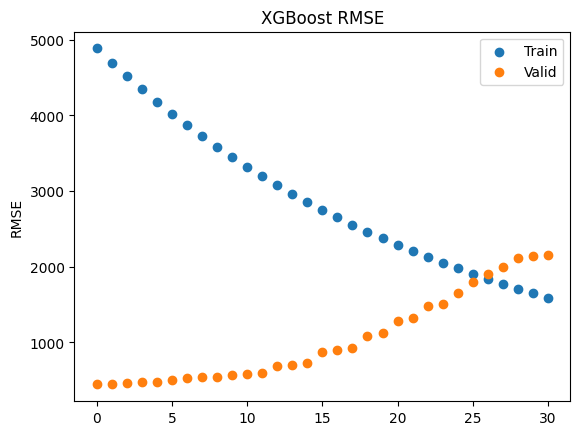

In [7]:
# 绘制一下train valid 的loss
train_loss = evals_result['validation_0']['rmse']
valid_loss = evals_result['validation_1']['rmse']


epochs = len(train_loss)
x_axis = range(0, epochs)

plt.scatter(x_axis, train_loss, label='Train')
plt.scatter(x_axis, valid_loss, label='Valid')
plt.legend()

plt.ylabel('RMSE')
plt.title('XGBoost RMSE')
plt.show()

In [8]:
regressor.best_iteration

0

In [9]:
regressor = xgb.XGBRegressor(gamma=0.0, base_score=0.7,colsample_bytree=1,learning_rate=0.05, n_estimators=23)
regressor.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], verbose=True)

[0]	validation_0-rmse:4883.33036	validation_1-rmse:445.02324
[1]	validation_0-rmse:4697.40456	validation_1-rmse:451.28076
[2]	validation_0-rmse:4518.44987	validation_1-rmse:459.92504
[3]	validation_0-rmse:4346.65382	validation_1-rmse:475.15304
[4]	validation_0-rmse:4182.05538	validation_1-rmse:483.91275
[5]	validation_0-rmse:4023.63737	validation_1-rmse:504.05538
[6]	validation_0-rmse:3871.42596	validation_1-rmse:525.99475
[7]	validation_0-rmse:3725.17614	validation_1-rmse:538.55635
[8]	validation_0-rmse:3585.06037	validation_1-rmse:550.34956
[9]	validation_0-rmse:3450.25221	validation_1-rmse:564.89809
[10]	validation_0-rmse:3320.53636	validation_1-rmse:587.21544
[11]	validation_0-rmse:3198.44503	validation_1-rmse:591.66673
[12]	validation_0-rmse:3079.66624	validation_1-rmse:686.38779
[13]	validation_0-rmse:2967.07815	validation_1-rmse:705.54347
[14]	validation_0-rmse:2858.98279	validation_1-rmse:724.98911
[15]	validation_0-rmse:2753.43268	validation_1-rmse:879.62046
[16]	validation_0-

XGBRegressor(base_score=0.7, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None, colsample_bytree=1,
             device=None, early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0.0, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.05, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=23,
             n_jobs=None, num_parallel_tree=None, random_state=None, ...)

In [10]:
_ = regressor.predict(X_test)
prediction = pd.DataFrame(_, index=y_test.index, columns=y_test.columns)
prediction

0
datetime   instrument              
2022-01-01 1INCH-USDT      0.226691
           1INCHDOWN-USDT  0.226691
           1INCHUP-USDT    0.226691
           AAVE-USDT       0.226691
           AAVEDOWN-USDT   0.226691
...                             ...
2023-06-30 YGG-USDT        0.226691
           ZEC-USDT        0.226691
           ZEN-USDT        0.226691
           ZIL-USDT        0.226691
           ZRX-USDT        0.226691

[223314 rows x 1 columns]

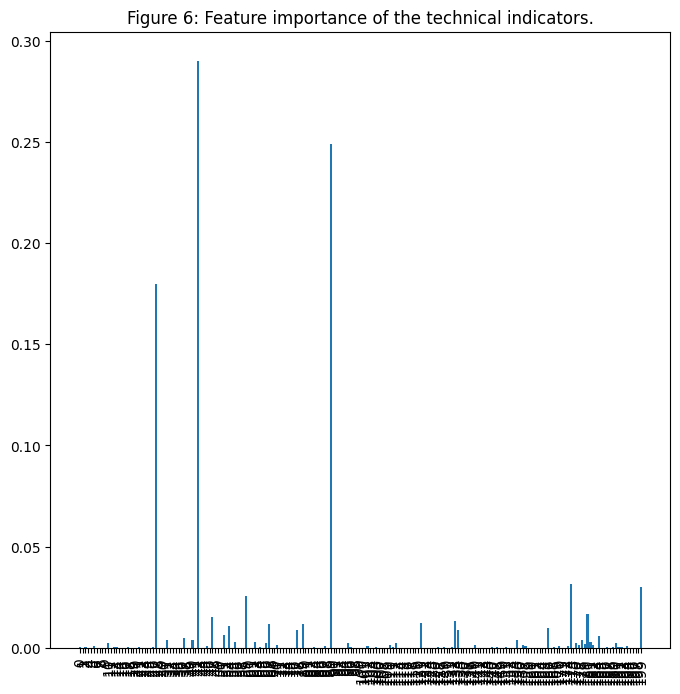

In [11]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test.columns)
plt.title('Figure 6: Feature importance of the technical indicators.')
plt.show()

In [12]:
im = {i: rslt["exprs"][idx] for idx, i in enumerate(xgbModel.feature_importances_.tolist())}
sorted_dict = dict(sorted(im.items(), key=lambda item: item[0]))    
sorted_dict

{0.0: Log(Abs(Mul(WMA(Mul(WMA(Sub(Add(Constant(-0.01),Log($taker_buy_base_asset_volume)),$quote_volume),50),Constant(-0.01)),50),$trade_num))),
 1.266454931377059e-13: Max(Add(Constant(-2.0),Div(Std(Log($taker_buy_base_asset_volume),30),$taker_buy_quote_asset_volume)),20),
 2.5058965319457727e-12: Var(Log($volume),40),
 2.5681197619864538e-12: Div(Constant(0.01),$trade_num),
 3.0443154507703296e-12: Add(Var(Div(Constant(-10.0),$trade_num),30),Min($taker_buy_quote_asset_volume,20)),
 3.2390370767465537e-12: Div(WMA($taker_buy_base_asset_volume,20),$high),
 3.677037407195938e-12: Mad(Mul(Constant(1.0),Log($open)),30),
 1.2243904778941328e-09: Add(Constant(0.5),Abs(Max(Ref($taker_buy_base_asset_volume,40),30))),
 1.5775551975849567e-09: Div(Add(Greater(Less(Constant(-0.5),$taker_buy_quote_asset_volume),$volume),$trade_num),$taker_buy_quote_asset_volume),
 1.7274173202963539e-09: Div(Greater(Constant(0.5),$trade_num),WMA($trade_num,40)),
 3.802146153475405e-09: Sub(Mad(Ref(Abs(Sub(Constant

In [14]:
qlib_backtest = QlibBacktest(
        benchmark="ETH-USDT",
        top_k=50,
        n_drop=50,
        deal="open",
        open_cost=0.0015,
        close_cost=0.0015,
        min_cost=5,
    )
qlib_backtest.run(prediction, f"{prefix}/{code}_{timestamp}")

[36905:MainThread](2024-01-19 22:33:13,540) WARNING - qlib.BaseExecutor - [executor.py:121] - `common_infra` is not set for <qlib.backtest.executor.SimulatorExecutor object at 0x172827550>
[36905:MainThread](2024-01-19 22:33:13,544) INFO - qlib.backtest caller - [__init__.py:93] - Create new exchange


                                  0
datetime   instrument              
2022-01-01 1INCH-USDT      0.226691
           1INCHDOWN-USDT  0.226691
           1INCHUP-USDT    0.226691
           AAVE-USDT       0.226691
           AAVEDOWN-USDT   0.226691
...                             ...
2023-06-30 YGG-USDT        0.226691
           ZEC-USDT        0.226691
           ZEN-USDT        0.226691
           ZIL-USDT        0.226691
           ZRX-USDT        0.226691

[223314 rows x 1 columns]


[36905:MainThread](2024-01-19 22:33:19,610) WARNING - qlib.online operator - [exchange.py:219] - $open field data contains nan.
[36905:MainThread](2024-01-19 22:33:19,611) WARNING - qlib.online operator - [exchange.py:219] - $open field data contains nan.
[36905:MainThread](2024-01-19 22:33:19,612) WARNING - qlib.online operator - [exchange.py:226] - factor.day.bin file not exists or factor contains `nan`. Order using adjusted_price.
[36905:MainThread](2024-01-19 22:33:19,612) WARNING - qlib.online operator - [exchange.py:228] - trade unit 100 is not supported in adjusted_price mode.
backtest loop:  78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 14/18 [00:00<00:00, 67.94it/s]

[I 2022-02-01 00:00:00]: buy XEC-USDT, price 0.00, amount 25249170042.546707, deal_amount 25249170042.546707, factor None, value 1900000.00, cash 98097150.00.
[I 2022-02-01 00:00:00]: buy WIN-USDT, price 0.00, amount 6959706643.977762, deal_amount 6959706643.977762, factor None, value 1900000.00, cash 96194300.00.
[I 2022-02-01 00:00:00]: buy XRPDOWN-USDT, price 0.00, amount 3018268369.726913, deal_amount 3018268369.726913, factor None, value 1900000.00, cash 94291450.00.
[I 2022-02-01 00:00:00]: buy SHIB-USDT, price 0.00, amount 76366557528.80646, deal_amount 76366557528.80646, factor None, value 1900000.00, cash 92388600.00.
[I 2022-02-01 00:00:00]: buy DENT-USDT, price 0.00, amount 789692459.586802, deal_amount 789692459.586802, factor None, value 1900000.00, cash 90485750.00.
[I 2022-02-01 00:00:00]: buy 1INCH-USDT, price 1.45, amount 1309441.7866769854, deal_amount 1309441.7866769854, factor None, value 1900000.00, cash 88582900.00.
[I 2022-02-01 00:00:00]: buy PLA-USDT, price 0.8

backtest loop: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 66.91it/s]


[I 2023-04-01 00:00:00]: buy EPX-USDT, price 0.00, amount 0.0, deal_amount 0, factor None, value 0.00, cash 0.00.
[I 2023-04-01 00:00:00]: buy LUNC-USDT, price 0.00, amount 0.0, deal_amount 0, factor None, value 0.00, cash 0.00.
[I 2023-04-01 00:00:00]: buy LEVER-USDT, price 0.00, amount 0.0, deal_amount 0, factor None, value 0.00, cash 0.00.
[I 2023-04-01 00:00:00]: buy ADADOWN-USDT, price 0.00, amount 0.0, deal_amount 0, factor None, value 0.00, cash 0.00.
[I 2023-04-01 00:00:00]: buy KEY-USDT, price 0.01, amount 0.0, deal_amount 0, factor None, value 0.00, cash 0.00.
[I 2023-04-01 00:00:00]: buy BNX-USDT, price 0.61, amount 0.0, deal_amount 0, factor None, value 0.00, cash 0.00.
[I 2023-05-01 00:00:00]: buy LUNC-USDT, price 0.00, amount 0.0, deal_amount 0, factor None, value 0.00, cash 0.00.
[I 2023-05-01 00:00:00]: buy ADADOWN-USDT, price 0.00, amount 0.0, deal_amount 0, factor None, value 0.00, cash 0.00.
[I 2023-05-01 00:00:00]: buy EPX-USDT, price 0.00, amount 0.0, deal_amount 0

                 account    return  total_turnover  turnover     total_cost  \
datetime                                                                      
2022-01-01  1.000000e+08  0.000000    0.000000e+00  0.000000       0.000000   
2022-02-01  1.003086e+08  0.004511    9.500000e+07  0.950000  142500.000000   
2022-03-01  1.219162e+08  0.215480    9.961462e+07  0.046004  149421.937500   
2022-04-01  9.725835e+07 -0.202250    9.983878e+07  0.001839  149758.170614   
2022-05-01  5.392546e+07 -0.445543    9.984967e+07  0.000112  149833.170614   
2022-06-01  4.768014e+07 -0.115813    9.985014e+07  0.000009  149858.170614   
2022-07-01  5.711992e+07  0.197981    9.985014e+07  0.000000  149858.170614   
2022-08-01  5.425578e+07 -0.050143    9.985014e+07  0.000000  149858.170614   
2022-09-01  4.957869e+07 -0.086204    9.985014e+07  0.000000  149858.170614   
2022-10-01  4.959931e+07  0.000416    9.985014e+07  0.000000  149858.170614   
2022-11-01  4.082440e+07 -0.176916    9.985014e+07  

{'sharpe': -3.2306808084962078,
 'annual_return': -8.988104890277427,
 'max_drawdown': -0.9978311717551827,
 'information_ratio': -2.883926247350175,
 'annual_excess_return': -6.745785313007344,
 'excess_max_drawdown': -0.8445791359286466}

In [42]:
b_list = ["BTC", "DASH", "DCR", "DOGE","ETC","ETH","LTC","SOL", "XEM","XMR", "ZEC"]
p_list = [r + "-USDT" for r in b_list]
most_popular = []
with open("/Users/yangguangyu/.qlib/qlib_data/crypto_data_1d/instruments/all.txt", "r") as f:
    for line in f.readlines():
        b, st, ed = line.split("\t")
#         print(b)
#         for bn in b_list:
#             if not b.startswith(bn):
#                 continue
#             print(line)
        if b in p_list:
            most_popular.append(line)
most_popular

['BTC-USDT\t2017-08-17\t2024-01-12\n',
 'DASH-USDT\t2019-03-28\t2024-01-12\n',
 'DCR-USDT\t2020-07-30\t2024-01-12\n',
 'DOGE-USDT\t2019-07-05\t2024-01-12\n',
 'ETC-USDT\t2018-06-12\t2024-01-12\n',
 'ETH-USDT\t2017-08-17\t2024-01-12\n',
 'LTC-USDT\t2017-12-13\t2024-01-12\n',
 'SOL-USDT\t2020-08-11\t2024-01-12\n',
 'XEM-USDT\t2020-11-24\t2024-01-12\n',
 'XMR-USDT\t2019-03-15\t2024-01-12\n',
 'ZEC-USDT\t2019-03-21\t2024-01-12\n']

In [43]:
with open("/Users/yangguangyu/.qlib/qlib_data/crypto_data_1d/instruments/mp10.txt", "w") as f:
    for mp in most_popular:
        f.write(mp)
with open("/Users/yangguangyu/.qlib/qlib_data/crypto_data_1d/instruments/mp10.txt", "r") as f:
    for line in f.readlines():
        print(line)

BTC-USDT	2017-08-17	2024-01-12

DASH-USDT	2019-03-28	2024-01-12

DCR-USDT	2020-07-30	2024-01-12

DOGE-USDT	2019-07-05	2024-01-12

ETC-USDT	2018-06-12	2024-01-12

ETH-USDT	2017-08-17	2024-01-12

LTC-USDT	2017-12-13	2024-01-12

SOL-USDT	2020-08-11	2024-01-12

XEM-USDT	2020-11-24	2024-01-12

XMR-USDT	2019-03-15	2024-01-12

ZEC-USDT	2019-03-21	2024-01-12



## 因子检验

In [70]:
# 引入常用库
import pandas as pd
import numpy as np
import scipy.stats as st

import alphalens as al# 因子分析

import pickle
from tqdm import *
import itertools  # 迭代器工具
import datetime as dt
from dateutil.parser import parser
import empyrical as ep
from alphalens import plotting
# 画图
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdate
from matplotlib.pyplot import MultipleLocator
import seaborn as sns
from matplotlib.gridspec import GridSpec # 划分子图

# 设置字体 用来正常显示中文标签
mpl.rcParams['font.sans-serif'] = ['serif']
mpl.rcParams['font.family'] = 'serif'
# 用来正常显示负号
mpl.rcParams['axes.unicode_minus'] = False

# 图表主题
plt.style.use('ggplot')

### 数据准备

In [22]:
prefix = "/Users/yangguangyu/Projects/QuantLearning/research/test_result/alphagen/crypto/new_all_200_5_20240119092204/"
file_path = prefix + "53248_steps_pool.json"

# prefix = "/Users/yangguangyu/Projects/QuantLearning/research/test_result/alphagen/crypto/new_all_200_5_20240120000808/"
# file_path = prefix + "24576_steps_pool.json"


data = CryptoDataLP(instrument="mp10",
                    start_time='2021-01-01',
                    end_time='2023-10-30',
                    device=torch.device("cpu"),
                    processors=[])

instruments: mp10
raw df:                               $open        $close         $high          $low  \
datetime   instrument                                                           
2020-09-23 BTC-USDT    10529.610352  10241.459961  10537.150391  10136.820312   
           DASH-USDT      68.139999     64.860001     68.480003     64.269997   
           DCR-USDT       11.505000     11.038000     12.338000     11.038000   
           DOGE-USDT       0.002641      0.002544      0.002649      0.002536   
           ETC-USDT        4.947000      4.835700      4.992000      4.773100   
...                             ...           ...           ...           ...   
2023-11-29 LTC-USDT       69.760002     70.000000     70.459999     69.150002   
           SOL-USDT       58.180000     59.310001     61.779999     57.720001   
           XEM-USDT        0.035420      0.036490      0.036740      0.035240   
           XMR-USDT      167.699997    165.899994    167.899994    164.899994   
  

In [23]:
import json
import copy
with open(file_path, "r") as f:
    rslt = json.load(f)
    exprs = rslt.pop("exprs")
    _exprs = []
    for expr in exprs:
        e = copy.deepcopy(expr)
        for k, v in EXPR_MAP.items():
            e = e.replace(k, v)
        _exprs.append(eval(e))
    rslt["exprs"] = _exprs

In [58]:
aw = [(w, a) for w, a in zip(rslt["weights"], rslt["exprs"])]
sorted_aw = list(sorted(aw, key=lambda item: abs(item[0])))    
top_n_alpha = sorted_aw[-5:]
top_10_aw

[(0.1358320387498219,
  Div(Div(Constant(30.0),Log($volume)),Greater($close,Mul(Mul($low,$taker_buy_quote_asset_volume),Constant(30.0))))),
 (-0.15195104563721118,
  Std(Ref(Div(Constant(0.01),Div(Sub($taker_buy_base_asset_volume,Constant(0.01)),Constant(5.0))),30),20)),
 (0.15406108056043064, Div(WMA($taker_buy_base_asset_volume,20),$high)),
 (0.16192601158503309,
  Std(Sub($taker_buy_base_asset_volume,Sub(Delta($volume,30),Constant(-5.0))),10)),
 (0.18104672956437265,
  Add(Constant(30.0),Ref(Abs(Med($taker_buy_base_asset_volume,50)),10))),
 (-0.18390209967832752,
  Div(Log(Sub($low,Sub(Constant(0.5),Sub($taker_buy_base_asset_volume,Constant(-0.5))))),$low)),
 (0.1972197786881614,
  Std(Div(Sub(Less(Constant(30.0),$volume),Mul($high,$taker_buy_base_asset_volume)),$quote_volume),10)),
 (-0.21886191166258512, Div(Log(Sum($low,40)),Abs(Mul($close,$trade_num)))),
 (-0.34791115851651877, EMA(Div(Constant(30.0),Max($high,50)),30)),
 (-0.4108192715261862,
  Med(Add($taker_buy_base_asset_vol

### 单因子分析

In [30]:
expr = sorted_aw[-1][1]
print(expr)
e = expr.evaluate(data)
_data_df = data.make_dataframe(e)
# 重命名多重索引的名字
_data_df.rename(columns={'0': 'factor_value'}, inplace=True)
_data_df.index.names = ['date', 'asset']
_data_df

Med(Add($taker_buy_base_asset_volume,Constant(-1.0)),40)


factor_value
date       asset                  
2021-01-01 BTC-USDT   3.680801e+04
           DASH-USDT  7.725388e+04
           DCR-USDT   9.555117e+03
           DOGE-USDT  5.057726e+08
           ETC-USDT   1.575022e+06
...                            ...
2023-10-30 LTC-USDT   1.760442e+05
           SOL-USDT   1.759306e+06
           XEM-USDT   1.246973e+07
           XMR-USDT   2.609755e+04
           ZEC-USDT   2.552389e+04

[11363 rows x 1 columns]

In [31]:
features = ['$close']
print(f"instruments: {data._instrument}")
close_df = data._load_exprs(features)
close_df.reset_index(inplace=True)
# 重命名列
close_df.rename(columns={'datetime': 'date', 'instrument': 'asset'}, inplace=True)
# 将DataFrame从长格式转换为宽格式
close_df = close_df.pivot(index='date', columns='asset', values='$close')
close_df

instruments: mp10


asset,BTC-USDT,DASH-USDT,DCR-USDT,DOGE-USDT,ETC-USDT,ETH-USDT,LTC-USDT,SOL-USDT,XEM-USDT,XMR-USDT,ZEC-USDT
date,,,,,,,,,,,
2020-09-23,10241.459961,64.860001,11.038,0.002544,4.835700,320.720001,42.959999,2.854800,NaN,87.169998,51.840000
2020-09-24,10736.320312,67.790001,11.737,0.002630,4.968800,348.970001,44.919998,3.143300,NaN,91.839996,55.160000
2020-09-25,10686.669922,68.550003,12.063,0.002701,4.977200,351.920013,46.020000,3.193700,NaN,92.930000,54.869999
2020-09-26,10728.599609,69.040001,12.112,0.002697,5.362100,353.920013,46.029999,3.128700,NaN,94.629997,56.200001
2020-09-27,10774.250000,68.779999,11.944,0.002695,5.444000,357.489990,46.049999,3.157800,NaN,97.089996,55.549999
...,...,...,...,...,...,...,...,...,...,...,...
2023-11-25,37780.671875,31.150000,14.420,0.078940,19.420000,2083.090088,71.870003,58.820000,0.03674,172.000000,30.139999
2023-11-26,37447.429688,30.760000,14.330,0.078680,19.110001,2062.330078,70.029999,57.570000,0.03626,169.399994,29.549999
2023-11-27,37242.699219,29.780001,13.970,0.078840,18.549999,2027.500000,69.220001,55.060001,0.03518,165.500000,28.780001


In [ ]:
factor_data = al.utils.get_clean_factor_and_forward_returns(_data_df,
                                                          close_df,
#                                                           groupby=factor_groups,
                                                          quantiles=5,
                                                          periods=(1, 5))

<Axes: title={'center': 'Mean Period Wise Return By Factor Quantile'}, ylabel='Mean Return (bps)'>

findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsof

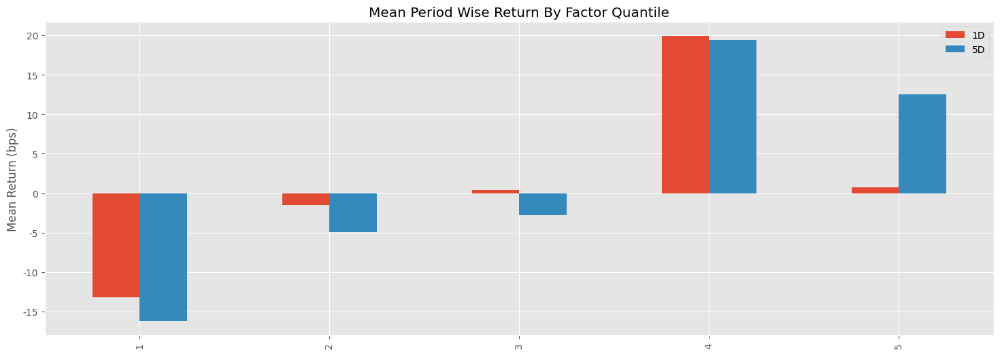

In [34]:
# 查看因子分组收益情况
mean_quant_ret, std_quantile = al.performance.mean_return_by_quantile(factor_data)

mean_quant_rateret = mean_quant_ret.apply(
    al.utils.rate_of_return, axis=0,base_period = '1D'
)
al.plotting.plot_quantile_returns_bar(mean_quant_rateret)

In [35]:
# 查看IC
ic = al.performance.factor_information_coefficient(factor_data)
al.plotting.plot_information_table(ic)

Information Analysis


,1D,5D
IC Mean,-0.025,-0.030
IC Std.,0.342,0.367
Risk-Adjusted IC,-0.072,-0.081
t-stat(IC),-2.318,-2.612
p-value(IC),0.021,0.009
IC Skew,0.042,-0.034
IC Kurtosis,-0.529,-0.661


In [36]:
# 查看RANK IC
periods = al.utils.get_forward_returns_columns(factor_data.columns)
periods = list(map(lambda p: pd.Timedelta(p).days, periods))

autocorrelation = pd.concat(
    [
        al.performance.factor_rank_autocorrelation(factor_data, period)
        for period in periods
    ],
    axis=1,
)

auto_corr = pd.DataFrame()
for period, p_data in autocorrelation.iteritems():
    auto_corr.loc["Mean Factor Rank Autocorrelation",
                  "{}D".format(period)] = p_data.mean()
al.utils.print_table(auto_corr.apply(lambda x: x.round(3)))

/var/folders/xj/8b3m4m7n4xsgjxqhl9c106k40000gn/T/ipykernel_66611/3545936020.py:15: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



,1D,5D
Mean Factor Rank Autocorrelation,0.999,0.997


findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsof

findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsof

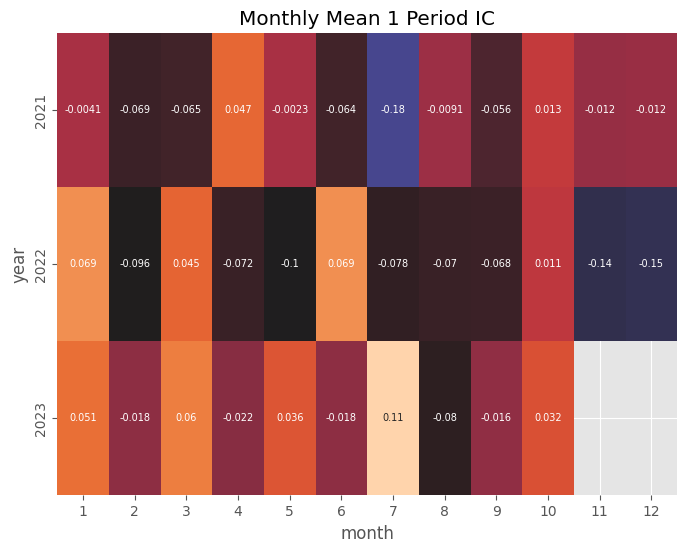

In [37]:
mean_monthly_ic = al.performance.mean_information_coefficient(
            factor_data,
            by_time="M",
        )

mean_monthly_ic.index = pd.MultiIndex.from_tuples(
        [[i.year, i.month] for i in mean_monthly_ic.index],
        names=["year", "month"])

plt.figure(figsize=(8,6))
plt.title("Monthly Mean 1 Period IC")

# 1 periods IC headmap
sns.heatmap(mean_monthly_ic['1D'].unstack(),
            annot=True,
           annot_kws={"size": 7},
           linecolor='white',
           center=-0.1,
           cbar=False);

findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsof

findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsoft YaHei' not found.
findfont: Font family 'Microsof

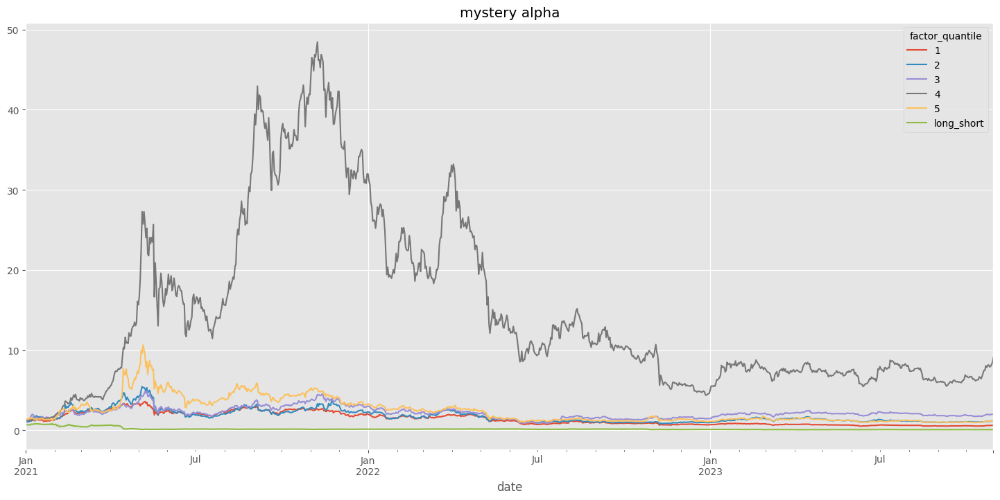

In [38]:
factor_data = factor_data[['1D', 'factor_quantile']].copy()

pivot_ret = pd.pivot_table(factor_data.reset_index(
), index='date', columns='factor_quantile', values='1D')

# 多空收益
ls_ret = pivot_ret[1] - pivot_ret[5]

# 计算累计收益
mpl.rcParams['font.family'] = 'Microsoft YaHei'
algriothm_cum = np.exp(np.log1p(pivot_ret).cumsum())
algriothm_cum['long_short'] = np.exp(np.log1p(ls_ret).cumsum())
algriothm_cum.plot(figsize=(18, 8), title='mystery alpha');

### 多个因子分析

In [59]:
factor_dic = {}
for idx, aw in enumerate(top_n_alpha):
    w, expr = aw
    print(expr)
    e = expr.evaluate(data)
    _data_df = data.make_dataframe(e)
    # 重命名多重索引的名字
    _data_df.rename(columns={'0': 'factor_value'}, inplace=True)
    _data_df.index.names = ['date', 'asset']
    factor_data = al.utils.get_clean_factor_and_forward_returns(_data_df,
                                                          close_df,
#                                                           groupby=factor_groups,
                                                          quantiles=5,
                                                          periods=(1, 5))
    factor_dic[f"alpha_{idx + 1}"] = factor_data

Div(Log(Sub($low,Sub(Constant(0.5),Sub($taker_buy_base_asset_volume,Constant(-0.5))))),$low)


/Users/yangguangyu/anaconda3/envs/quant_dev/lib/python3.9/site-packages/alphalens/utils.py:166: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



Dropped 0.0% entries from factor data: 0.0% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Std(Div(Sub(Less(Constant(30.0),$volume),Mul($high,$taker_buy_base_asset_volume)),$quote_volume),10)


/Users/yangguangyu/anaconda3/envs/quant_dev/lib/python3.9/site-packages/alphalens/utils.py:166: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



Dropped 0.0% entries from factor data: 0.0% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Div(Log(Sum($low,40)),Abs(Mul($close,$trade_num)))


/Users/yangguangyu/anaconda3/envs/quant_dev/lib/python3.9/site-packages/alphalens/utils.py:166: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



Dropped 0.0% entries from factor data: 0.0% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
EMA(Div(Constant(30.0),Max($high,50)),30)


/Users/yangguangyu/anaconda3/envs/quant_dev/lib/python3.9/site-packages/alphalens/utils.py:166: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



Dropped 0.4% entries from factor data: 0.4% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Med(Add($taker_buy_base_asset_volume,Constant(-1.0)),40)
Dropped 0.0% entries from factor data: 0.0% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


/Users/yangguangyu/anaconda3/envs/quant_dev/lib/python3.9/site-packages/alphalens/utils.py:166: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



In [60]:
# 获取分组收益
def get_factor_group_return(factor_df: pd.DataFrame) -> pd.DataFrame:
    '''
    获取因子的N分位收益
    ------
    输入参数:
        factor_df:MuliIndex level0-date level1-code columns:factor|factor_quantile|1
    '''

    return pd.pivot_table(factor_df.reset_index(),
                          index='date',
                          columns='factor_quantile',
                          values='1D')

apm_ret_dic = {k:get_factor_group_return(v) for k,v in factor_dic.items()}
apm_ret_dic

{'alpha_1': factor_quantile         1         2         3         4         5
 date                                                             
 2021-01-01       0.072149  0.037059  0.063535 -0.004210  0.384671
 2021-01-02       0.083967  0.103751  0.043651  0.173519 -0.014062
 2021-01-03       0.000525 -0.021865  0.011420  0.107608 -0.018437
 2021-01-04       0.044544  0.010508 -0.018261 -0.049102  0.011424
 2021-01-05       0.076153  0.061779  0.114365 -0.030630  0.147324
 ...                   ...       ...       ...       ...       ...
 2023-10-26      -0.004669 -0.018947 -0.024328 -0.022052 -0.033532
 2023-10-27       0.003748  0.019814  0.008494  0.010481  0.022749
 2023-10-28       0.033024  0.011518  0.025430  0.013638  0.022997
 2023-10-29      -0.000593  0.017718  0.036919  0.011561  0.011641
 2023-10-30       0.001668 -0.004686  0.046530  0.014071  0.004607
 
 [1033 rows x 5 columns],
 'alpha_2': factor_quantile         1         2         3         4         5
 date       

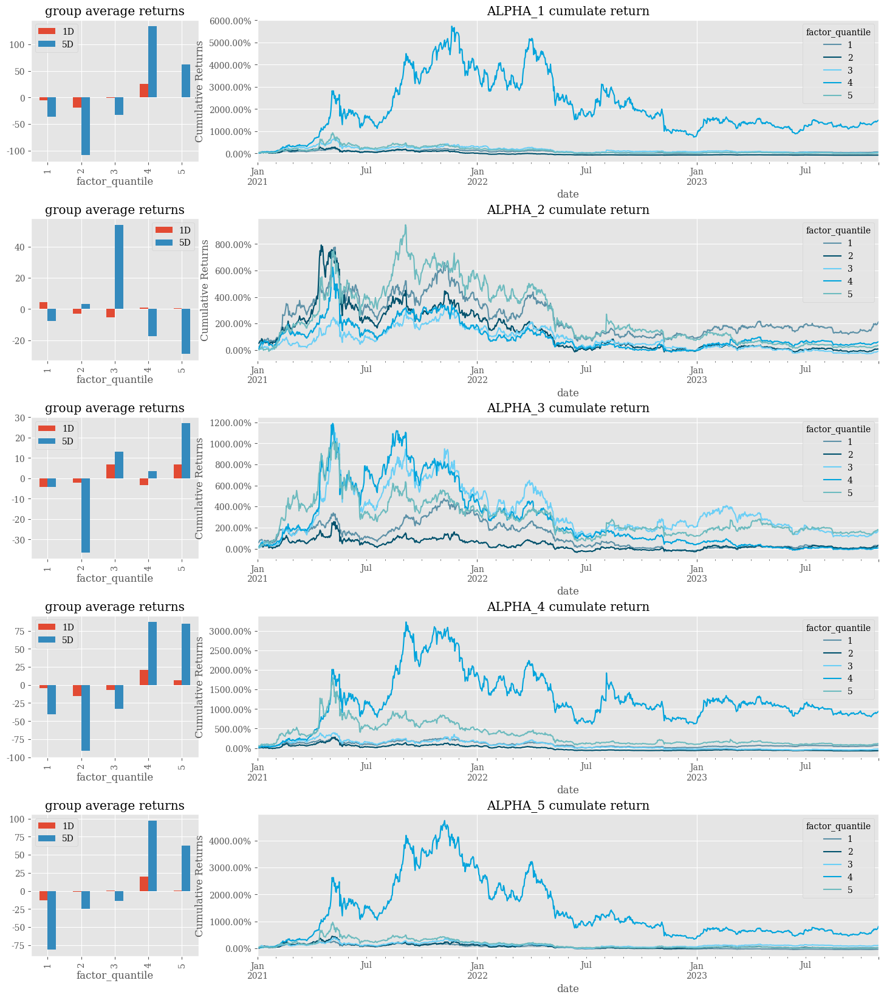

In [62]:
# 分组收益画图
color_map = ['#5D91A7', '#00516C', '#6BCFF6', '#00A4DC', '#6DBBBF',
             '#008982']  # 设置颜色

# 设置图表大小
mpl.rcParams['font.family'] = 'serif'
fig = plt.figure(figsize=(18, 5 * rows))
gs = GridSpec(len(top_n_alpha), 4, figure=fig)

for i, (factor_name, df) in enumerate(apm_ret_dic.items()):

    ax1 = plt.subplot(gs[i, :1])
    ax2 = plt.subplot(gs[i, 1:])

    # 计算分组平均收益
    mean_ret, _ = al.performance.mean_return_by_quantile(factor_dic[factor_name])
    mean_ret = mean_ret * 10000

#     ax1.set_ylabel('Mean Return (bps)')
    mean_ret.plot.bar(ax=ax1, title='group average returns')

    # 计算累计收益率
    ep.cum_returns(df).plot(ax=ax2,
                            title=f'{factor_name.upper()} cumulate return',
                            color=color_map)

    ax2.set_ylabel('Cumulative Returns')
    ax2.yaxis.set_major_formatter(
        mpl.ticker.FuncFormatter(lambda x, pos: '%.2f%%' % (x * 100)))

    plt.subplots_adjust(hspace=0.4, wspace=0.35)

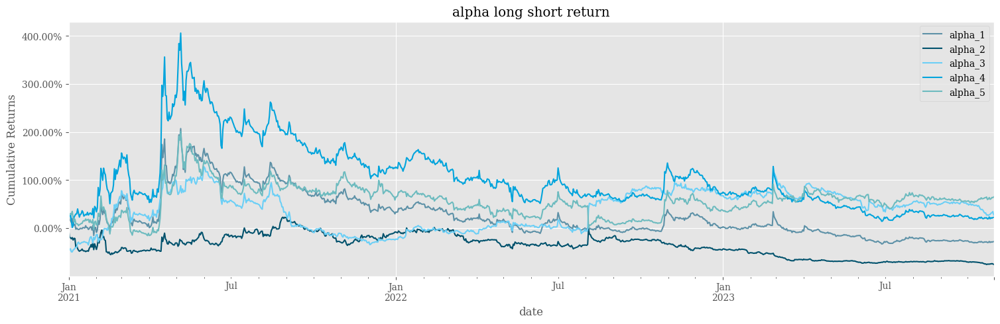

In [64]:
# 多空收益画图

color_map = ['#5D91A7', '#00516C', '#6BCFF6', '#00A4DC', '#6DBBBF',
             '#008982']  # 设置颜色

# 设置图表大小
mpl.rcParams['font.family'] = 'serif'
fig, ax = plt.subplots(figsize=(18, 5))

excess_df = pd.concat(
    (ep.cum_returns(df[5] - df[1]) for df in apm_ret_dic.values()), axis=1)
excess_df.columns = list(apm_ret_dic.keys())

excess_df.plot(ax=ax, title='alpha long short return', color=color_map)
ax.set_ylabel('Cumulative Returns')
ax.yaxis.set_major_formatter(
    mpl.ticker.FuncFormatter(lambda x, pos: '%.2f%%' % (x * 100)))


In [65]:
close_df

asset,BTC-USDT,DASH-USDT,DCR-USDT,DOGE-USDT,ETC-USDT,ETH-USDT,LTC-USDT,SOL-USDT,XEM-USDT,XMR-USDT,ZEC-USDT
date,,,,,,,,,,,
2020-09-23,10241.459961,64.860001,11.038,0.002544,4.835700,320.720001,42.959999,2.854800,NaN,87.169998,51.840000
2020-09-24,10736.320312,67.790001,11.737,0.002630,4.968800,348.970001,44.919998,3.143300,NaN,91.839996,55.160000
2020-09-25,10686.669922,68.550003,12.063,0.002701,4.977200,351.920013,46.020000,3.193700,NaN,92.930000,54.869999
2020-09-26,10728.599609,69.040001,12.112,0.002697,5.362100,353.920013,46.029999,3.128700,NaN,94.629997,56.200001
2020-09-27,10774.250000,68.779999,11.944,0.002695,5.444000,357.489990,46.049999,3.157800,NaN,97.089996,55.549999
...,...,...,...,...,...,...,...,...,...,...,...
2023-11-25,37780.671875,31.150000,14.420,0.078940,19.420000,2083.090088,71.870003,58.820000,0.03674,172.000000,30.139999
2023-11-26,37447.429688,30.760000,14.330,0.078680,19.110001,2062.330078,70.029999,57.570000,0.03626,169.399994,29.549999
2023-11-27,37242.699219,29.780001,13.970,0.078840,18.549999,2027.500000,69.220001,55.060001,0.03518,165.500000,28.780001


In [ ]:
# 获取基准数据
benchmark = close_df()
benchmark = benchmark.reindex(apm_ret_dic['apm_raw'].index)

### IC分析

In [68]:
# 计算头部、底部分组组合的ic
top_ic_dic = {
    k: al.performance.factor_information_coefficient(f.query('factor_quantile == 5').fillna(0))
    for k, f in factor_dic.items()
}

bottom_ic_dic = {
    k: al.performance.factor_information_coefficient(f.query('factor_quantile == 1').fillna(0))
    for k, f in factor_dic.items()
}

/Users/yangguangyu/anaconda3/envs/quant_dev/lib/python3.9/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.

/Users/yangguangyu/anaconda3/envs/quant_dev/lib/python3.9/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.

/Users/yangguangyu/anaconda3/envs/quant_dev/lib/python3.9/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.

/Users/yangguangyu/anaconda3/envs/quant_dev/lib/python3.9/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.

/Users/yangguangyu/anaconda3/envs/quant_dev/lib/python3.9/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.



/Users/yangguangyu/anaconda3/envs/quant_dev/lib/python3.9/site-packages/alphalens/plotting.py:217: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.

/Users/yangguangyu/anaconda3/envs/quant_dev/lib/python3.9/site-packages/alphalens/plotting.py:217: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.

/Users/yangguangyu/anaconda3/envs/quant_dev/lib/python3.9/site-packages/alphalens/plotting.py:217: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.

/Users/yangguangyu/anaconda3/envs/quant_dev/lib/python3.9/site-packages/alphalens/plotting.py:217: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



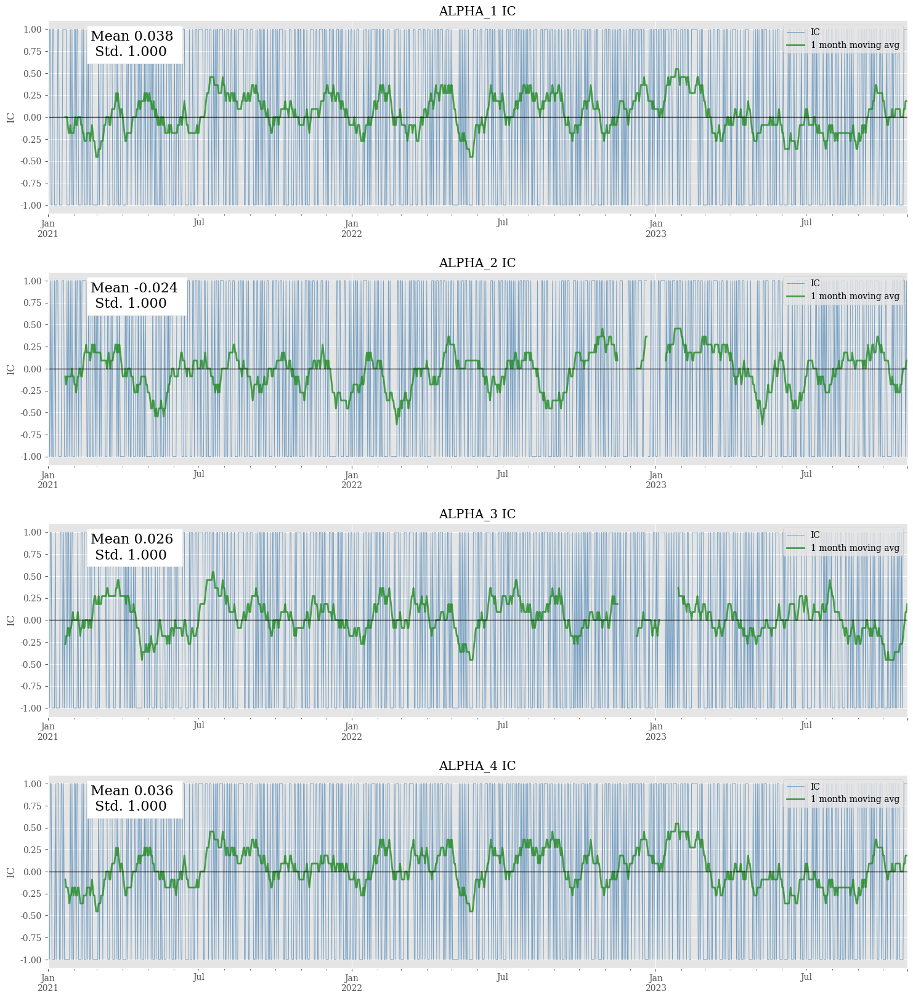

In [71]:
# 画IC
fig,axes = plt.subplots(rows,figsize=(18,5 * rows))

for ax,(factor_name,ic_ser) in zip(axes, top_ic_dic.items()):
    
    plotting.plot_ic_ts(ic_ser,[ax])
    ax.set_title(f'{factor_name.upper()} IC')
    plt.subplots_adjust(hspace=0.3)

### 换手率

In [72]:
factor_dic.keys()

dict_keys(['alpha_1', 'alpha_2', 'alpha_3', 'alpha_4', 'alpha_5'])

In [76]:
# 换手率相关计算
cal_alpha = "alpha_1"
quantile_turnover = pd.concat(
    (al.performance.quantile_turnover(factor_dic[cal_alpha]['factor_quantile'], q, 1)
     for q in range(1, 6)),
    axis=1)

autocorrelation = al.performance.factor_rank_autocorrelation(factor_dic[cal_alpha], 1)

Turnover Analysis


/Users/yangguangyu/anaconda3/envs/quant_dev/lib/python3.9/site-packages/alphalens/plotting.py:153: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.

/Users/yangguangyu/anaconda3/envs/quant_dev/lib/python3.9/site-packages/alphalens/plotting.py:157: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



,alpha_1D
Quantile 1 Mean Turnover,0.004
Quantile 2 Mean Turnover,0.056
Quantile 3 Mean Turnover,0.100
Quantile 4 Mean Turnover,0.051
Quantile 5 Mean Turnover,0.001


,alpha_1D
Mean Factor Rank Autocorrelation,0.996


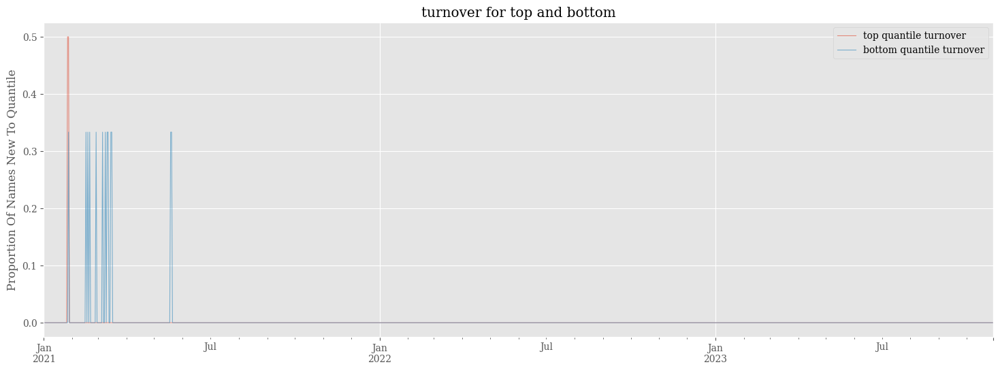

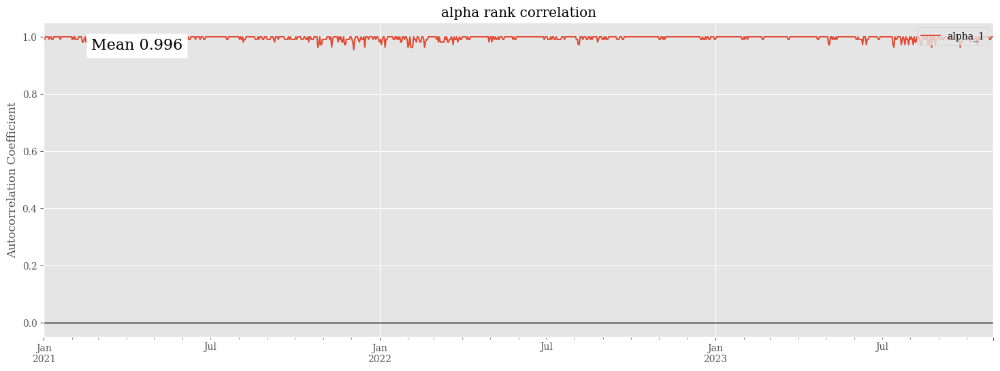

In [78]:
# 分组换手率及排名自相关性
plotting.plot_turnover_table(autocorrelation.to_frame(cal_alpha), {cal_alpha:quantile_turnover})

plotting.plot_top_bottom_quantile_turnover(quantile_turnover)
plt.title('turnover for top and bottom');

plotting.plot_factor_rank_auto_correlation(autocorrelation.to_frame(cal_alpha))
plt.legend(loc='upper right')
plt.title('alpha rank correlation');